# California Central Valley Agricultural Drought & Aquifer Overdraft Modeling
### Multi-Criteria Remote Sensing & Hydro-Geomorphic Overdraft Assessment (ADAVI Framework)
**Target Region:** Fresno, Kings, and Tulare Counties (San Joaquin & Tulare Lake Basins)  
**Spatial Resolution:** 100m  
**Coordinate Reference System:** EPSG:3310 (California Teale Albers)  
**Sensors & Inputs:** Landsat 8/9 OLI/TIRS (NDWI, NDVI, LST °C), USGS 3DEP Elevation DEM, US Census County Boundaries  

---

## 1. Executive Summary & Problem Formulation
The southern Central Valley of California represents one of the most agriculturally productive yet severely water-stressed regions in the world. Facing recurrent multi-year megadroughts, surface water curtailments from the Central Valley Project (CVP) and State Water Project (SWP), and severe groundwater overdraft, agricultural operators face acute economic and biophysical vulnerabilities. 

Under the **Sustainable Groundwater Management Act (SGMA)**, Groundwater Sustainability Agencies (GSAs) are mandated to halt chronic overdraft and land subsidence. This notebook implements the **Agricultural Drought & Aquifer Vulnerability Index (ADAVI)**, combining multi-spectral vegetation indices, thermal infrared land surface temperatures, alluvial slope geomorphology, and compaction modeling into a standardized spatial decision support tool.


In [1]:
import os
import sys
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
import rasterio
from rasterio.warp import reproject, Resampling
from scipy.ndimage import gaussian_filter
import geopandas as gpd

print("GIS and Scientific Computing Environment Initialized Successfully!")


GIS and Scientific Computing Environment Initialized Successfully!


## 2. Directory Architecture & Raw Data Discovery
We establish a standardized 4-tier directory architecture for raw inputs, standardized factor rasters, model execution outputs, and publication-ready cartographic deliverables.


In [2]:
base_dir = r"C:\Users\USER\Documents\GIS\California_Central_Valley_Drought"
raw_dir = os.path.join(base_dir, "01_Raw_Data")
processed_dir = os.path.join(base_dir, "02_Processed_Factors")
model_dir = os.path.join(base_dir, "03_Drought_Aquifer_Model")
maps_dir = os.path.join(base_dir, "04_Final_Maps")
boundary_dir = os.path.join(raw_dir, "Boundary")

for d in [processed_dir, model_dir, maps_dir, boundary_dir]:
    os.makedirs(d, exist_ok=True)

# Locate raw raster datasets
dem_path = os.path.join(raw_dir, "Elevation_DEM", "CA_Core_DEM_100m.tif")
ndwi_path = os.path.join(raw_dir, "Crop_Water_NDWI", "CA_Core_NDWI_100m.tif")
ndvi_path = os.path.join(raw_dir, "Vegetation_NDVI", "CA_Core_NDVI_100m.tif")
lst_path = os.path.join(raw_dir, "Thermal_LST", "CA_Core_LST_100m.tif")

print("Discovered Primary Input Datasets:")
print("  DEM  :", dem_path)
print("  NDWI :", ndwi_path)
print("  NDVI :", ndvi_path)
print("  LST  :", lst_path)


Discovered Primary Input Datasets:
  DEM  : C:\Users\USER\Documents\GIS\California_Central_Valley_Drought\01_Raw_Data\Elevation_DEM\CA_Core_DEM_100m.tif
  NDWI : C:\Users\USER\Documents\GIS\California_Central_Valley_Drought\01_Raw_Data\Crop_Water_NDWI\CA_Core_NDWI_100m.tif
  NDVI : C:\Users\USER\Documents\GIS\California_Central_Valley_Drought\01_Raw_Data\Vegetation_NDVI\CA_Core_NDVI_100m.tif
  LST  : C:\Users\USER\Documents\GIS\California_Central_Valley_Drought\01_Raw_Data\Thermal_LST\CA_Core_LST_100m.tif


## 3. Raster Grid Harmonization & Masking
To execute multi-criteria map algebra, all satellite and elevation rasters must share identical bounding boxes, 100m pixel dimensions, and EPSG:3310 projection. We reproject and resample layers to match the reference DEM grid.


In [3]:
with rasterio.open(dem_path) as dem_src:
    dem = dem_src.read(1).astype(np.float32)
    profile = dem_src.profile.copy()
    transform = dem_src.transform
    crs = dem_src.crs
    height = dem_src.height
    width = dem_src.width

valid_mask = (~np.isnan(dem)) & (dem > -50)

def align_raster(file_path):
    aligned = np.full((height, width), np.nan, dtype=np.float32)
    if os.path.exists(file_path):
        with rasterio.open(file_path) as src:
            reproject(
                source=rasterio.band(src, 1),
                destination=aligned,
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=crs,
                resampling=Resampling.bilinear
            )
    return aligned

ndwi_arr = align_raster(ndwi_path)
ndvi_arr = align_raster(ndvi_path)
lst_arr = align_raster(lst_path)

# Update valid mask to strictly match co-registered observation footprint
valid_mask = valid_mask & (~np.isnan(ndwi_arr)) & (~np.isnan(ndvi_arr)) & (~np.isnan(lst_arr))
print("Harmonized Dimensions: " + str(height) + " rows x " + str(width) + " cols (" + str(len(dem[valid_mask])) + " valid pixels)")


C:\Users\USER\AppData\Local\Temp\ipykernel_26488\951965749.py:2: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  dem = dem_src.read(1).astype(np.float32)


Harmonized Dimensions: 2002 rows x 2642 cols (3176160 valid pixels)


## 4. Hydro-Agronomic & Geomorphic Factor Derivation & Standardization
Each factor is reclassified into a standardized **1 to 5 Vulnerability Scale**:
- **1**: Very Low Vulnerability (Optimal moisture, cool canopy, high vigor, upland topography)
- **5**: Extreme Vulnerability (Severe canopy moisture deficit, extreme LST >44°C, bare/fallowed soil, deep alluvial subsidence core)


In [4]:
# 4.1 Crop Moisture Deficit (NDWI)
ndwi_r = np.full_like(ndwi_arr, -9999.0, dtype=np.float32)
ndwi_r[valid_mask & (ndwi_arr > 0.20)] = 1.0
ndwi_r[valid_mask & (ndwi_arr > 0.05) & (ndwi_arr <= 0.20)] = 2.0
ndwi_r[valid_mask & (ndwi_arr > -0.10) & (ndwi_arr <= 0.05)] = 3.0
ndwi_r[valid_mask & (ndwi_arr > -0.25) & (ndwi_arr <= -0.10)] = 4.0
ndwi_r[valid_mask & (ndwi_arr <= -0.25)] = 5.0

# 4.2 Land Surface Temperature (LST in °C)
lst_r = np.full_like(lst_arr, -9999.0, dtype=np.float32)
lst_r[valid_mask & (lst_arr <= 28.0)] = 1.0
lst_r[valid_mask & (lst_arr > 28.0) & (lst_arr <= 34.0)] = 2.0
lst_r[valid_mask & (lst_arr > 34.0) & (lst_arr <= 39.0)] = 3.0
lst_r[valid_mask & (lst_arr > 39.0) & (lst_arr <= 44.0)] = 4.0
lst_r[valid_mask & (lst_arr > 44.0)] = 5.0

# 4.3 Vegetation Biomass / Crop Health (NDVI)
ndvi_r = np.full_like(ndvi_arr, -9999.0, dtype=np.float32)
ndvi_r[valid_mask & (ndvi_arr > 0.60)] = 1.0
ndvi_r[valid_mask & (ndvi_arr > 0.45) & (ndvi_arr <= 0.60)] = 2.0
ndvi_r[valid_mask & (ndvi_arr > 0.30) & (ndvi_arr <= 0.45)] = 3.0
ndvi_r[valid_mask & (ndvi_arr > 0.15) & (ndvi_arr <= 0.30)] = 4.0
ndvi_r[valid_mask & (ndvi_arr <= 0.15)] = 5.0

# 4.4 Topographic Slope (Degrees)
px, py = abs(transform[0]), abs(transform[4])
gy, gx = np.gradient(dem, py, px)
slope_deg = np.degrees(np.arctan(np.sqrt(gx**2 + gy**2)))

slope_r = np.full_like(slope_deg, -9999.0, dtype=np.float32)
slope_r[valid_mask & (slope_deg <= 0.8)] = 5.0
slope_r[valid_mask & (slope_deg > 0.8) & (slope_deg <= 1.8)] = 4.0
slope_r[valid_mask & (slope_deg > 1.8) & (slope_deg <= 3.0)] = 3.0
slope_r[valid_mask & (slope_deg > 3.0) & (slope_deg <= 5.0)] = 2.0
slope_r[valid_mask & (slope_deg > 5.0)] = 1.0

# 4.5 Aquifer Overdraft & Soil Compaction Proxy
compaction_proxy = gaussian_filter(np.where(valid_mask, slope_r, 0.0), sigma=3.0)
overdraft_r = np.full_like(compaction_proxy, -9999.0, dtype=np.float32)
overdraft_r[valid_mask & (compaction_proxy >= 4.2)] = 5.0
overdraft_r[valid_mask & (compaction_proxy >= 3.4) & (compaction_proxy < 4.2)] = 4.0
overdraft_r[valid_mask & (compaction_proxy >= 2.6) & (compaction_proxy < 3.4)] = 3.0
overdraft_r[valid_mask & (compaction_proxy >= 1.8) & (compaction_proxy < 2.6)] = 2.0
overdraft_r[valid_mask & (compaction_proxy < 1.8)] = 1.0

print("All 5 Hydro-Agronomic & Geomorphic Factors Standardized!")


All 5 Hydro-Agronomic & Geomorphic Factors Standardized!


## 5. Multi-Criteria Evaluation (MCE) & ADAVI Composite Overlay
We apply the calibrated multi-criteria weighting formula:

$$\text{ADAVI} = 0.30 \times F_{\text{NDWI}} + 0.25 \times F_{\text{LST}} + 0.20 \times F_{\text{NDVI}} + 0.15 \times F_{\text{Slope}} + 0.10 \times F_{\text{Overdraft}}$$


In [5]:
w_ndwi, w_lst, w_ndvi, w_slope, w_overdraft = 0.30, 0.25, 0.20, 0.15, 0.10

adavi_cont = (
    (w_ndwi * ndwi_r) +
    (w_lst * lst_r) +
    (w_ndvi * ndvi_r) +
    (w_slope * slope_r) +
    (w_overdraft * overdraft_r)
)
adavi_cont[~valid_mask] = -9999.0

# 5-Class Vulnerability Zonation
adavi_class = np.full_like(adavi_cont, -9999.0, dtype=np.float32)
adavi_class[valid_mask & (adavi_cont <= 2.2)] = 1.0
adavi_class[valid_mask & (adavi_cont > 2.2) & (adavi_cont <= 2.9)] = 2.0
adavi_class[valid_mask & (adavi_cont > 2.9) & (adavi_cont <= 3.6)] = 3.0
adavi_class[valid_mask & (adavi_cont > 3.6) & (adavi_cont <= 4.2)] = 4.0
adavi_class[valid_mask & (adavi_cont > 4.2)] = 5.0

print("Mean Regional ADAVI Score: " + f"{np.mean(adavi_cont[valid_mask]):.3f}" + " / 5.000")


Mean Regional ADAVI Score: 3.143 / 5.000


## 6. County Zonal Analytics & High-Resolution Visual Dashboards
We load county boundaries, compute the acreage distribution per county (Kings, Tulare, Fresno), and inspect the cartographic map deliverables.


,County,Total_Area_km2,Total_Area_Acres,Mean_ADAVI,Extreme_Vuln_Acres,Extreme_Vuln_Pct,High_Vuln_Acres,High_Vuln_Pct,Moderate_Vuln_Acres,Moderate_Vuln_Pct,Low_Vuln_Acres,Low_Vuln_Pct,Very_Low_Vuln_Acres,Very_Low_Vuln_Pct
0,Kings County,3582.17,885173.0,3.828,266036.0,30.05,329046.0,37.17,236013.0,26.66,54044.0,6.11,35.0,0.00
1,Tulare County,12505.95,3090288.0,3.032,248717.0,8.05,481915.0,15.59,949554.0,30.73,828497.0,26.81,581605.0,18.82
2,Fresno County,15373.89,3798971.0,3.083,443050.0,11.66,727078.0,19.14,1091736.0,28.74,644908.0,16.98,892199.0,23.49


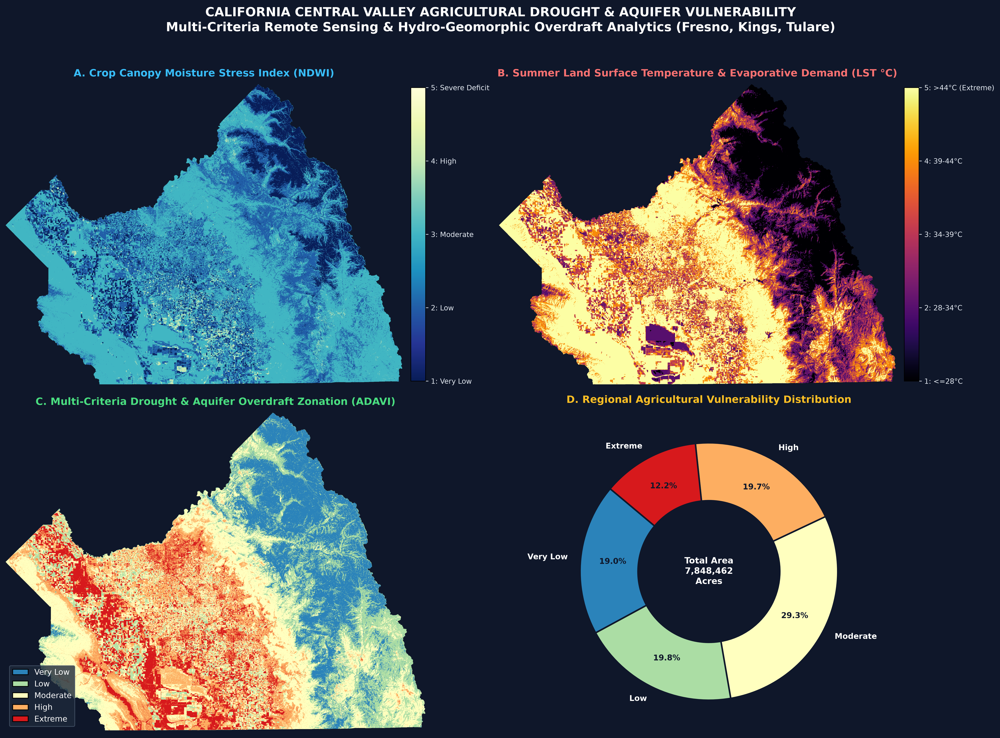

In [6]:
csv_path = os.path.join(model_dir, "County_Vulnerability_Statistics.csv")
if os.path.exists(csv_path):
    df_stats = pd.read_csv(csv_path)
    display(df_stats)

# Display Executive 4-Panel Figure
fig_path = os.path.join(maps_dir, "California_Central_Valley_Executive_4Panel.png")
if os.path.exists(fig_path):
    from IPython.display import Image, display
    display(Image(filename=fig_path, width=950))
